In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 51.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 108.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 90.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 869.9 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 104.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalli

In [2]:
!pip install ruamel_yaml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.7/117.7 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 739.1/739.1 kB 47.7 MB/s eta 0:00:00


In [3]:
# configuring the path of kaggle.json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle
!chod 600 ~/.kaggle/kaggle.json

/bin/bash: line 1: chod: command not found


In [4]:
!pip install opendatasets

In [5]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [6]:
import opendatasets as od
od.download(
    "https://www.kaggle.com/datasets/aifahim/dhakaaiyoloformatteddataset/data")

Dataset URL: https://www.kaggle.com/datasets/aifahim/dhakaaiyoloformatteddataset


100%|██████████| 330M/330M [00:00<00:00, 715MB/s]


100%|██████████| 5.35M/5.35M [00:00<00:00, 327MB/s]

image 1/1 /content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/images/train/01.jpg: 640x640 4 persons, 5 cars, 1 motorcycle, 2 buss, 9.7ms
Speed: 3.4ms preprocess, 9.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2


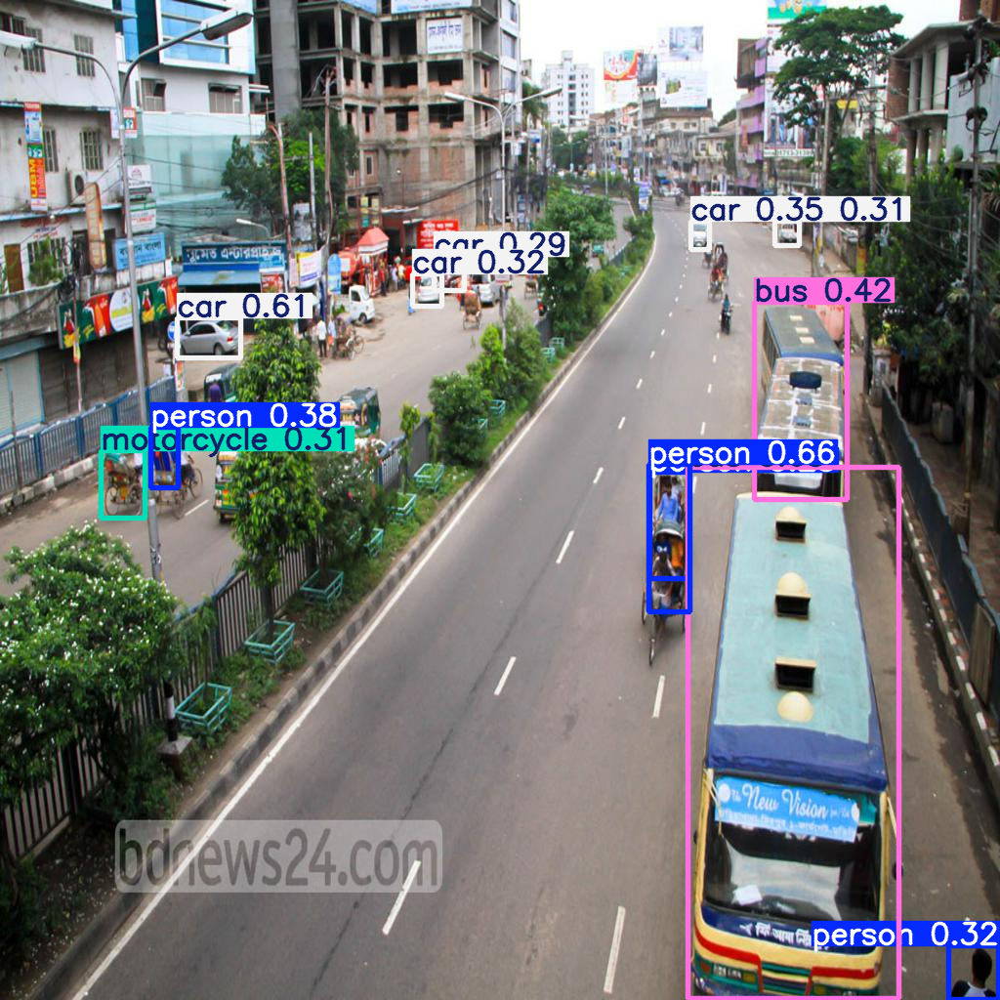

In [9]:
from ultralytics import YOLO
# Load the YOLOv8 nano model
model = YOLO('yolo11n.pt')

# Run object detection on an image URL with a confidence threshold of 0.25
result = model("/content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/images/train/01.jpg", conf=0.25, save=True)
# Show the first image's detection result (results are returned as a list, even for one image)
result[0].show()

# The model() call returns a list of results — one per image. Since we passed only one image, its result is at index 0.

In [10]:
!pip install ruamel.yaml

In [11]:
# read yaml file and modify it
# save it new file name data.yaml

import sys
import ruamel.yaml

yaml = ruamel.yaml.YAML()

# yaml.prserve_quotes = True
with open('/content/dhakaaiyoloformatteddataset/traffic_update.yaml') as fp:
  data = yaml.load(fp)
  # Correct the paths to the image directories
  data['train'] = "/content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/images/train"
  data['val'] = "/content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/images/val"

  print(data['train'])
  print(data['val'])

  # save the files
  with open('traffic_update.yaml', 'w') as fp :
    yaml.dump(data, fp)

/content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/images/train
/content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/images/val


In [13]:
model = YOLO('yolo11n.pt')


results = model.train(data="traffic_update.yaml", epochs=30, imgsz=640)

Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=traffic_update.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, p

train: Scanning /content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/labels/train.cache... 2390 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2390/2390 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 726.6±565.0 MB/s, size: 109.2 KB)


val: Scanning /content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/labels/val.cache... 600 images, 0 backgrounds, 0 corrupt: 100%|██████████| 600/600 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0004, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      5.01G      1.438      3.963      1.205         19        640: 100%|██████████| 150/150 [00:55<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.50it/s]

                   all        600       5090      0.426     0.0891     0.0682     0.0424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      5.01G       1.44      2.728      1.218         18        640: 100%|██████████| 150/150 [00:51<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.60it/s]


                   all        600       5090      0.592      0.141      0.114     0.0686

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      5.01G        1.4       2.24      1.216         87        640: 100%|██████████| 150/150 [00:52<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:08<00:00,  2.35it/s]

                   all        600       5090      0.569       0.15      0.138     0.0816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      5.01G      1.362      2.055      1.206        121        640: 100%|██████████| 150/150 [00:51<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.84it/s]


                   all        600       5090        0.5       0.19      0.164      0.101

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      5.01G      1.346      1.949      1.198         60        640: 100%|██████████| 150/150 [00:50<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:08<00:00,  2.26it/s]

                   all        600       5090      0.594      0.185      0.189      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      5.01G      1.306      1.857       1.18         56        640: 100%|██████████| 150/150 [00:52<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.40it/s]


                   all        600       5090      0.569      0.221      0.205      0.128

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      5.01G      1.296      1.763      1.171         53        640: 100%|██████████| 150/150 [00:52<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.68it/s]


                   all        600       5090      0.581      0.226      0.229      0.147

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      5.01G       1.29      1.732      1.164         78        640: 100%|██████████| 150/150 [00:51<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:08<00:00,  2.32it/s]


                   all        600       5090      0.597      0.219      0.234       0.15

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      5.01G      1.261      1.654       1.15         52        640: 100%|██████████| 150/150 [00:51<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.39it/s]

                   all        600       5090      0.593      0.234      0.242      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      5.01G      1.265       1.63      1.154         44        640: 100%|██████████| 150/150 [00:52<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.71it/s]


                   all        600       5090      0.625      0.226       0.25      0.158

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      5.01G      1.245        1.6      1.145         73        640: 100%|██████████| 150/150 [00:50<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:08<00:00,  2.32it/s]


                   all        600       5090       0.64       0.25      0.255      0.165

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      5.01G      1.219      1.564      1.136         61        640: 100%|██████████| 150/150 [00:51<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:08<00:00,  2.32it/s]

                   all        600       5090      0.537      0.279       0.27      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      5.01G      1.213      1.524      1.125         78        640: 100%|██████████| 150/150 [00:50<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.76it/s]


                   all        600       5090      0.581      0.252      0.282      0.186

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      5.01G      1.199      1.477      1.121         99        640: 100%|██████████| 150/150 [00:50<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.44it/s]

                   all        600       5090      0.561      0.264      0.269      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      5.01G      1.212      1.459      1.125        111        640: 100%|██████████| 150/150 [00:51<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.49it/s]


                   all        600       5090      0.641      0.249      0.277       0.18

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      5.01G      1.198      1.447      1.117        140        640: 100%|██████████| 150/150 [00:50<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.80it/s]

                   all        600       5090      0.576      0.273      0.282      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      5.01G       1.19      1.401      1.117        109        640: 100%|██████████| 150/150 [00:52<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:08<00:00,  2.31it/s]


                   all        600       5090      0.496      0.318        0.3      0.198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      5.01G      1.191      1.395      1.108         41        640: 100%|██████████| 150/150 [00:50<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.54it/s]


                   all        600       5090      0.581      0.296      0.305      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      5.01G      1.162      1.357      1.099         66        640: 100%|██████████| 150/150 [00:50<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.57it/s]

                   all        600       5090      0.609      0.294      0.305      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      5.01G      1.181      1.349      1.103         43        640: 100%|██████████| 150/150 [00:50<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.44it/s]

                   all        600       5090      0.627        0.3      0.317       0.21


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      5.01G      1.147      1.294      1.084         39        640: 100%|██████████| 150/150 [00:50<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        600       5090      0.604      0.298      0.317      0.214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      5.01G      1.122      1.236      1.076         32        640: 100%|██████████| 150/150 [00:48<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.48it/s]


                   all        600       5090      0.603      0.313      0.322      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      5.01G      1.116       1.21      1.066         73        640: 100%|██████████| 150/150 [00:48<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.66it/s]


                   all        600       5090      0.628      0.306      0.336      0.228

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      5.01G      1.109      1.196      1.064         34        640: 100%|██████████| 150/150 [00:49<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.59it/s]


                   all        600       5090      0.616      0.306       0.34       0.23

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      5.01G      1.088      1.166      1.055         29        640: 100%|██████████| 150/150 [00:47<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.40it/s]

                   all        600       5090      0.499      0.327      0.331      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      5.01G      1.092      1.156      1.052         41        640: 100%|██████████| 150/150 [00:49<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.64it/s]


                   all        600       5090      0.561      0.327      0.332      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      5.01G      1.078       1.13      1.048         24        640: 100%|██████████| 150/150 [00:47<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.42it/s]


                   all        600       5090      0.525       0.34      0.335      0.227

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      5.01G      1.075      1.126      1.043         54        640: 100%|██████████| 150/150 [00:48<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.88it/s]

                   all        600       5090      0.621      0.312      0.338       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      5.01G      1.069      1.109      1.044         33        640: 100%|██████████| 150/150 [00:48<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.45it/s]

                   all        600       5090      0.581      0.349      0.341      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      5.01G      1.063      1.098      1.039         79        640: 100%|██████████| 150/150 [00:48<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.77it/s]

                   all        600       5090      0.553      0.358      0.346      0.236



30 epochs completed in 0.490 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.5MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,586,247 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:10<00:00,  1.80it/s]


                   all        600       5090      0.553      0.358      0.346      0.236
             ambulance         22         22          1          0     0.0137    0.00958
         auto rickshaw         29         70      0.605      0.586      0.615      0.439
               bicycle         71         97      0.527      0.344      0.309      0.153
                   bus        300        698      0.654      0.687      0.706      0.494
                   car        321       1097       0.59      0.746      0.716      0.494
            garbagevan          1          1          0          0          0          0
          human hauler         30         40      0.143       0.05     0.0645     0.0442
               minibus         11         18      0.564      0.077       0.14      0.114
               minivan        103        158       0.29      0.418      0.302       0.21
             motorbike        237        466      0.524      0.609      0.587      0.316
                Picku

In [15]:
# Load a model
model = YOLO("yolo11n.pt")  # load an official model
model = YOLO("/content/runs/detect/train2/weights/best.pt")  # load a custom model

# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered

Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,586,247 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2537.4±613.6 MB/s, size: 114.2 KB)


val: Scanning /content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/labels/val.cache... 600 images, 0 backgrounds, 0 corrupt: 100%|██████████| 600/600 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:16<00:00,  2.32it/s]


                   all        600       5090      0.553      0.359      0.346      0.236
             ambulance         22         22          1          0     0.0138    0.00958
         auto rickshaw         29         70      0.603      0.586      0.615      0.435
               bicycle         71         97      0.529      0.348      0.307      0.154
                   bus        300        698      0.654      0.686      0.706      0.495
                   car        321       1097       0.59      0.748      0.717      0.494
            garbagevan          1          1          0          0          0          0
          human hauler         30         40      0.147       0.05     0.0642     0.0438
               minibus         11         18       0.57     0.0789      0.139      0.114
               minivan        103        158      0.284      0.418      0.302      0.209
             motorbike        237        466      0.527      0.607      0.587      0.316
                Picku


image 1/1 /content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/images/train/04.jpg: 640x640 12  buss, 1 car, 1 Pickup, 2 rickshaws, 1 three wheelers (CNG), 14.3ms
Speed: 6.7ms preprocess, 14.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict6


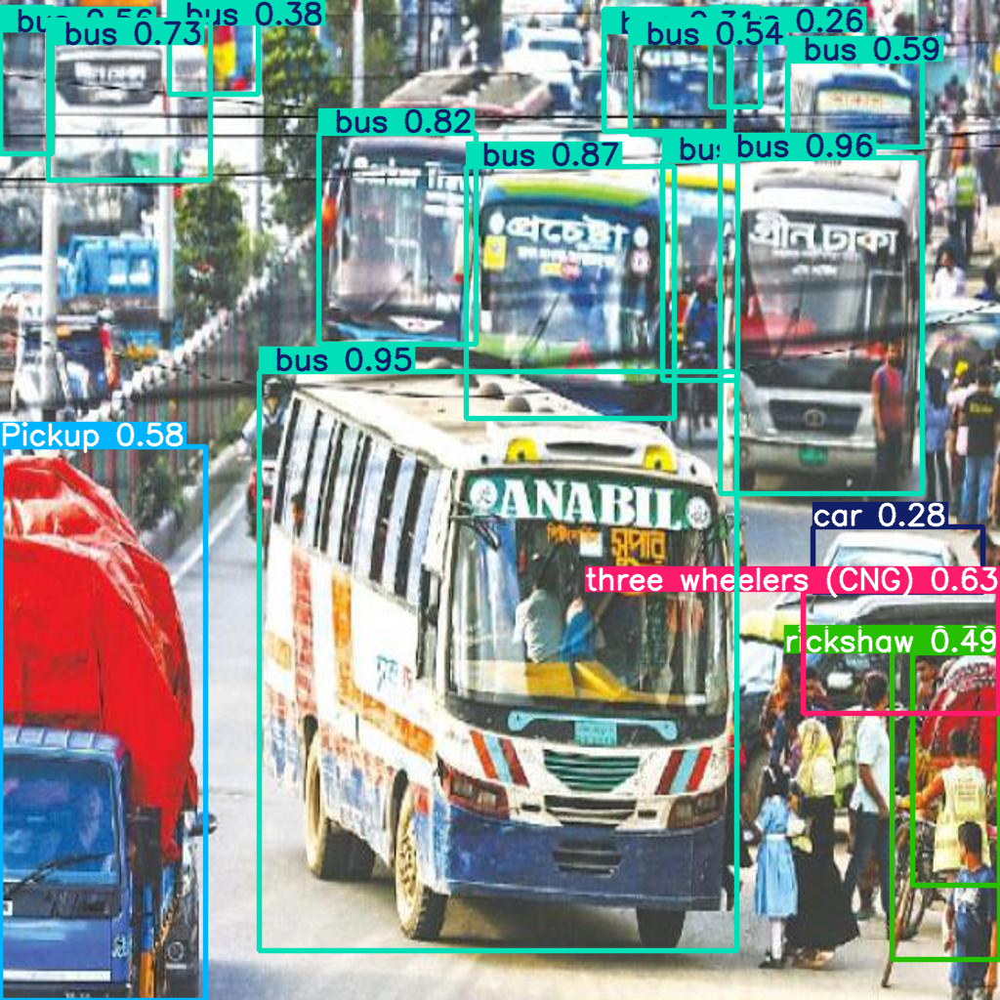

In [25]:
# model = YOLO('yolov11n.pt')

model = YOLO('/content/runs/detect/train2/weights/best.pt')
result = model('/content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/images/train/04.jpg', conf=0.25, save=True)
result[0].show()

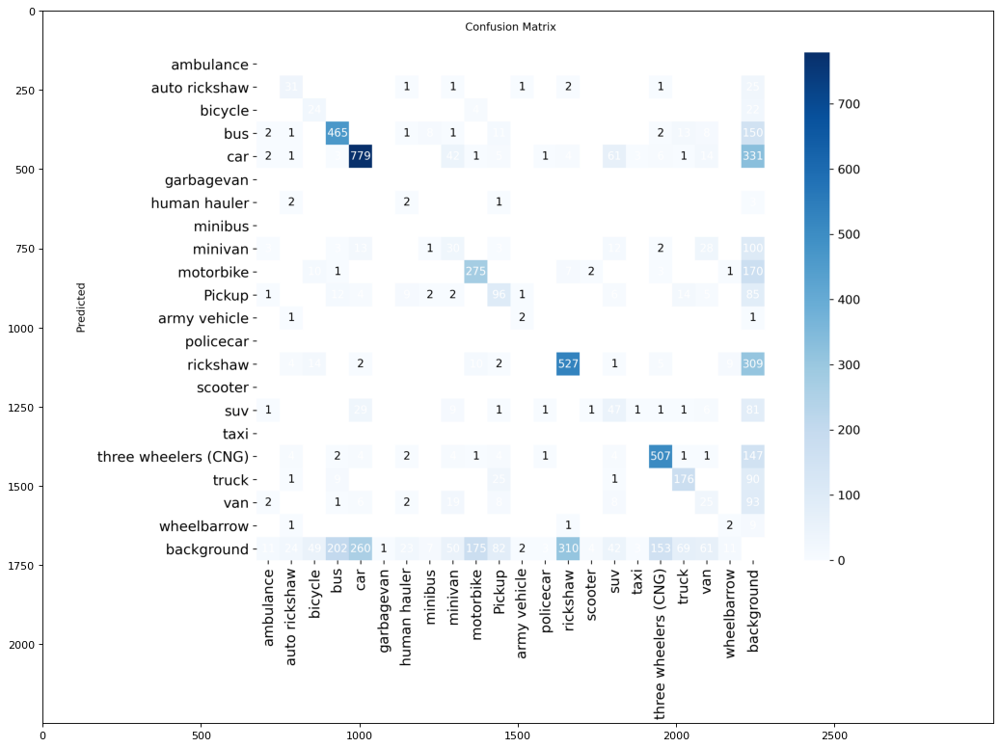

In [18]:
import matplotlib.pyplot as plt
plt.figure(figsize=(16,12 ), dpi=80)

plt.imshow(plt.imread('/content/runs/detect/train2/confusion_matrix.png'))

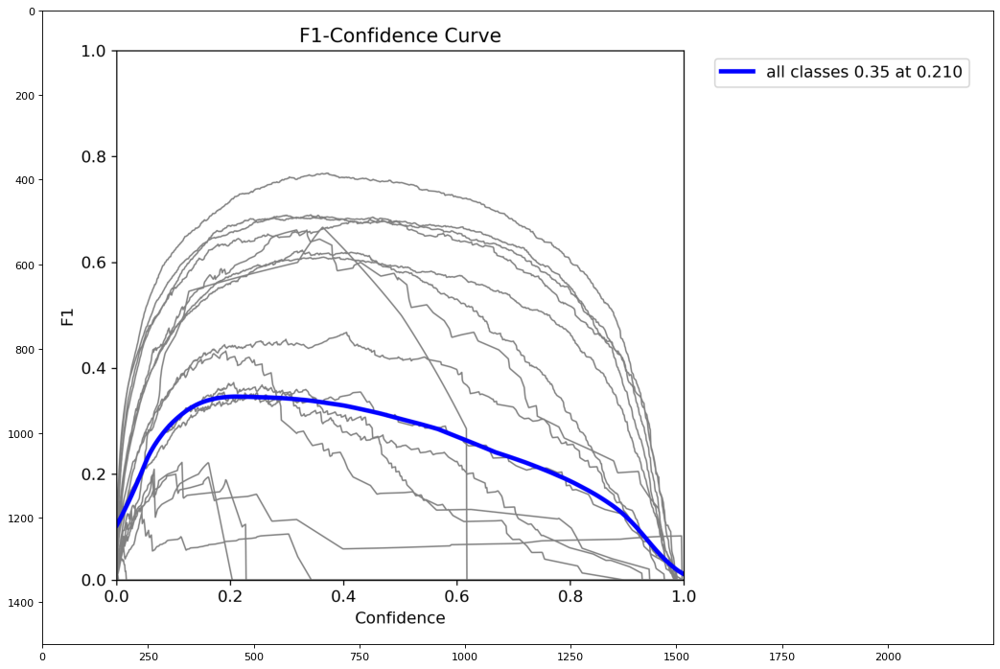

In [19]:
plt.figure(figsize=(16,12 ), dpi=80)

plt.imshow(plt.imread('/content/runs/detect/train2/F1_curve.png'))

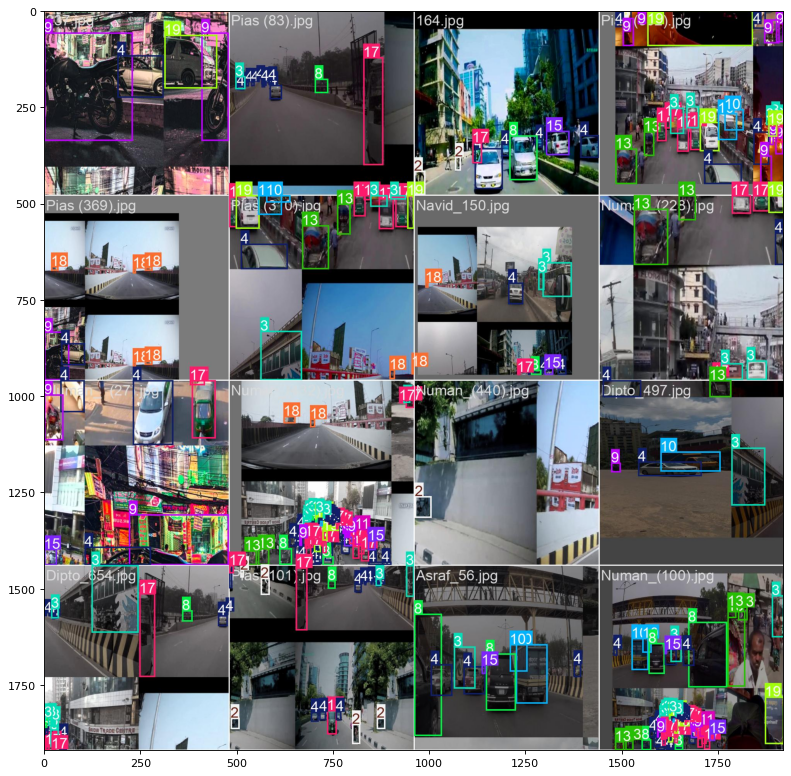

In [20]:

plt.figure(figsize=(16,12 ), dpi=80)

plt.imshow(plt.imread('/content/runs/detect/train2/train_batch1.jpg'))

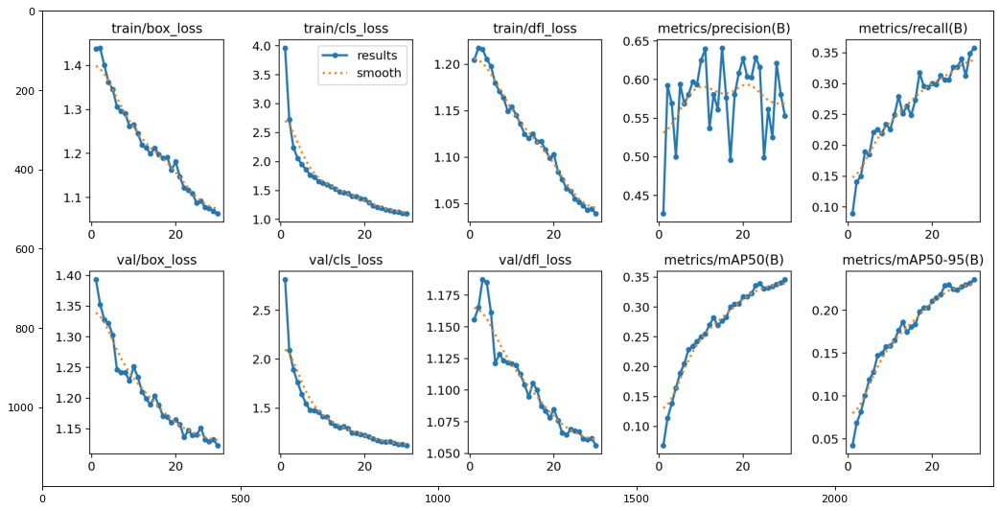

In [21]:
plt.figure(figsize=(16,12 ), dpi=80)

plt.imshow(plt.imread('/content/runs/detect/train2/results.png'))

In [22]:
from glob import glob
images = glob('/content/runs/detect/train2/*.png')
print(len(images))
print(images)

7
['/content/runs/detect/train2/confusion_matrix.png', '/content/runs/detect/train2/results.png', '/content/runs/detect/train2/F1_curve.png', '/content/runs/detect/train2/confusion_matrix_normalized.png', '/content/runs/detect/train2/R_curve.png', '/content/runs/detect/train2/PR_curve.png', '/content/runs/detect/train2/P_curve.png']


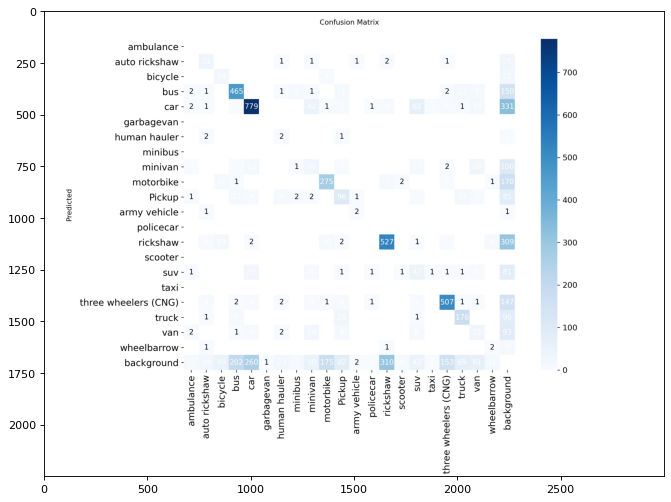

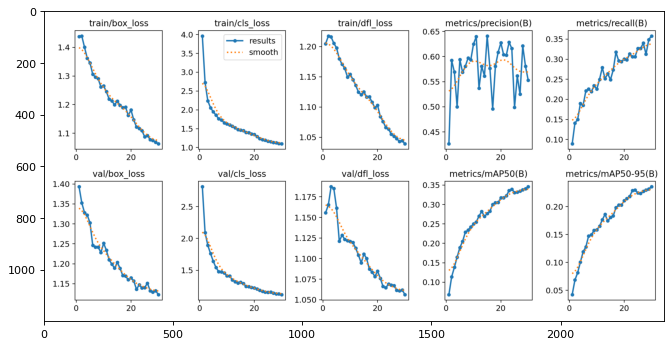

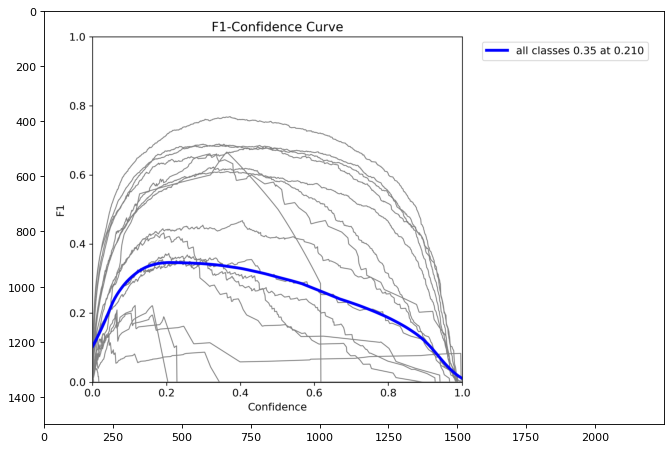

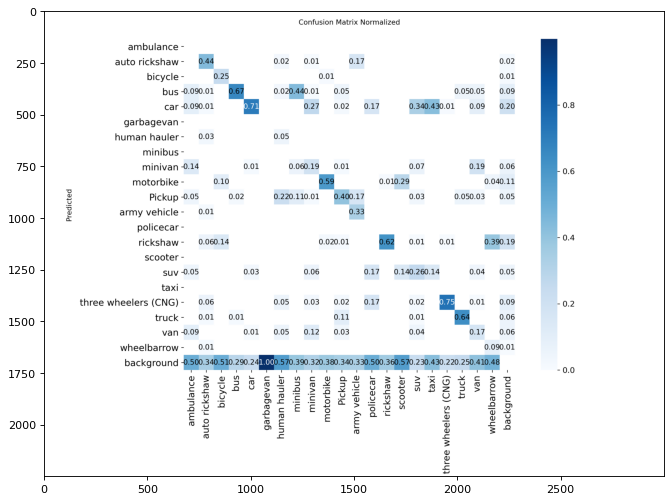

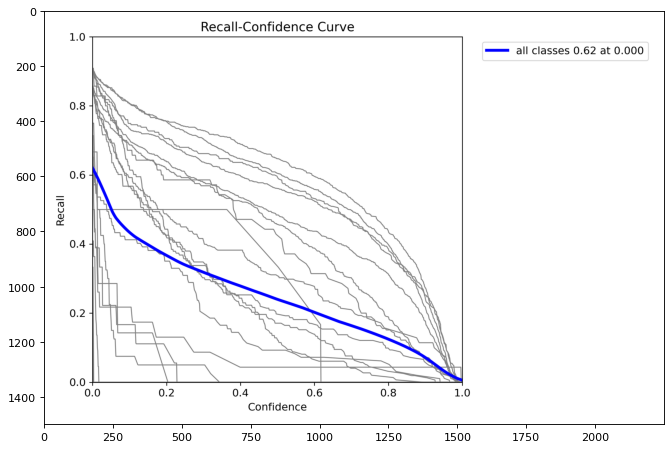

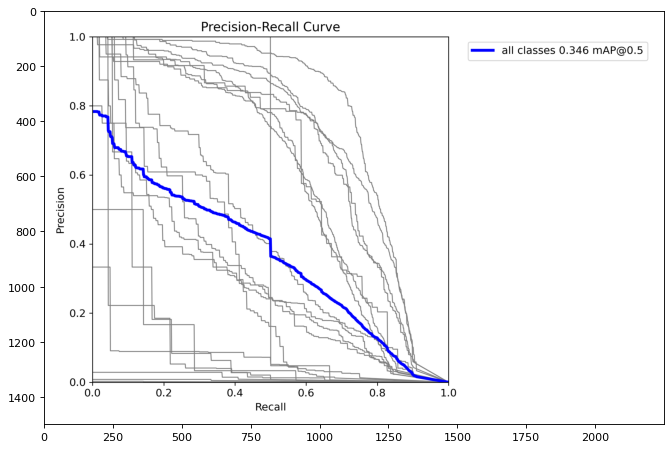

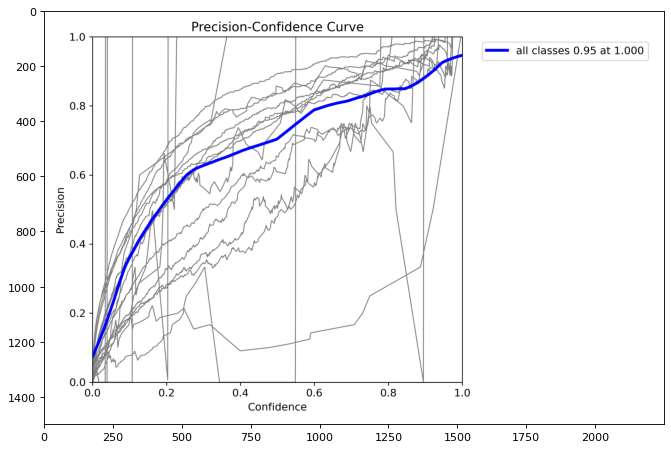

In [23]:
for i in images:
  plt.figure(figsize=(10,8), dpi=80)
  plt.imshow(plt.imread(i))



image 1/1 /content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/images/val/06.jpeg: 640x640 1  bus, 1 three wheelers (CNG), 3 trucks, 11.0ms
Speed: 5.5ms preprocess, 11.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict5


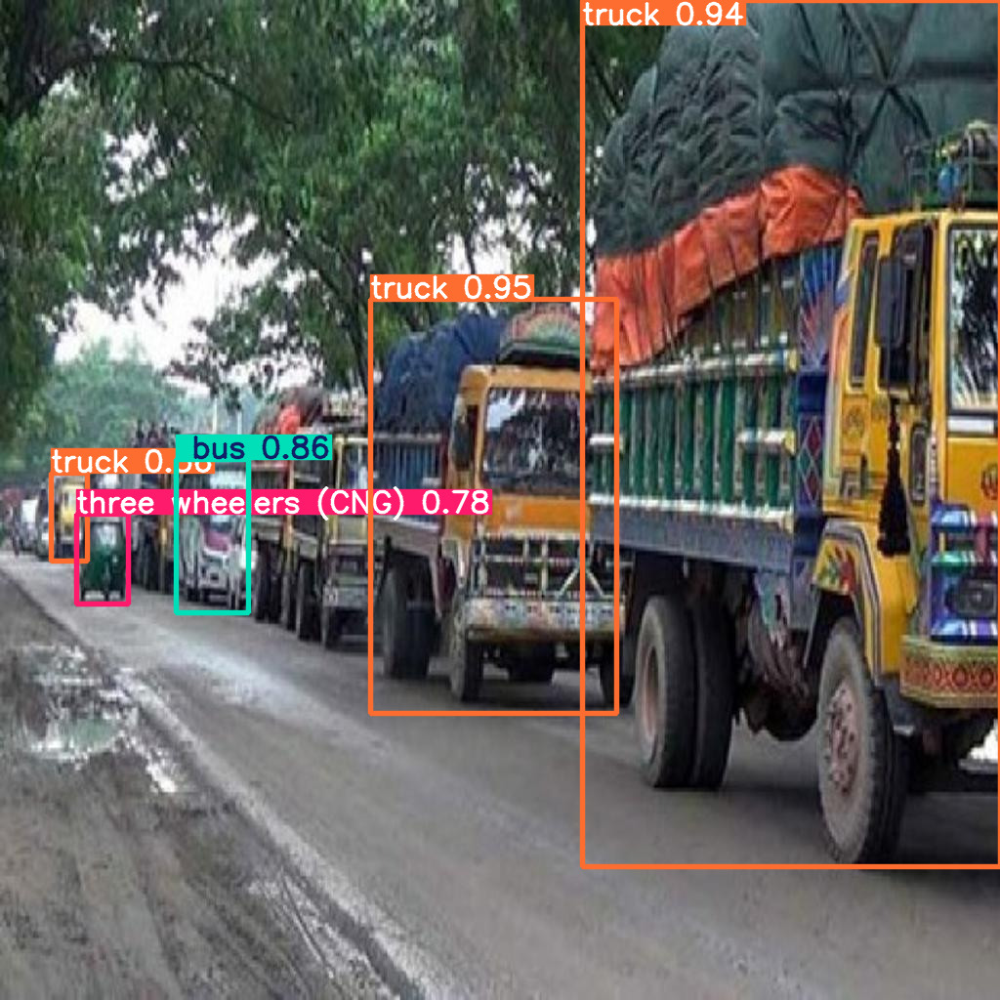

In [24]:
# model = YOLO('yolov11n.pt')

model = YOLO('/content/runs/detect/train2/weights/best.pt')
result = model('/content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/images/val/06.jpeg', conf=0.25, save=True)
result[0].show()


image 1/600 /content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/images/val/06.jpeg: 640x640 1  bus, 1 three wheelers (CNG), 3 trucks, 25.2ms
image 2/600 /content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/images/val/08.jpg: 640x640 13 cars, 2 motorbikes, 3 Pickups, 2 rickshaws, 1 three wheelers (CNG), 1 van, 16.9ms
image 3/600 /content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/images/val/09.jpg: 640x640 1  bus, 9 cars, 1 motorbike, 1 Pickup, 2 suvs, 1 three wheelers (CNG), 2 vans, 9.3ms
image 4/600 /content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/images/val/100.jpg: 640x640 1  bus, 3 Pickups, 5 trucks, 8.7ms
image 5/600 /content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/images/val/103.jpg: 640x640 2  buss, 1 car, 2 minivans, 5 motorbikes, 1 Pickup, 4 rickshaws, 1 suv, 1 three wheelers (CNG), 9.2ms
image 6/600 /content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/images/val/112.jpg: 640x640 2  buss, 2 cars, 2 motorbikes, 3 

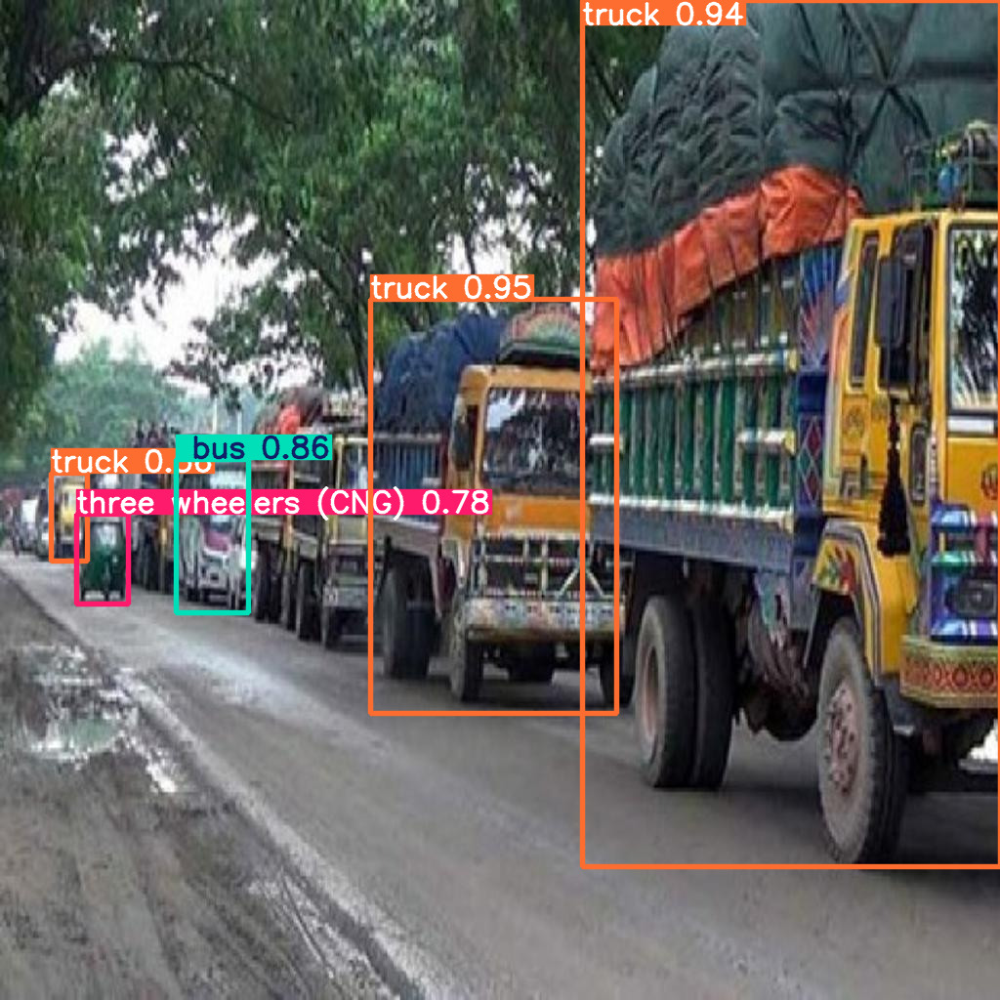

In [26]:

model = YOLO('/content/runs/detect/train2/weights/best.pt')
result = model('/content/dhakaaiyoloformatteddataset/yolov5_formetted_dataset/images/val', conf=0.25, save=True)
result[0].show()

In [29]:
import glob
import matplotlib.pyplot as plt


def read_images_from_folder(folder, img_ext):
    images = []  # List to store loaded images
    # Loop over all files with the given image extension in the folder
    for filename in glob.glob(f"{folder}/*.{img_ext}"):
        img = plt.imread(filename)  # Read the image using matplotlib
        if img is not None:
            images.append(img)  # Append non-empty image to the list
    return images  # Return the list of images

def sample_images32(images):
    sample = []  # List to store the first 16 images
    for i in range(32):
        sample.append(images[i])  # Add first 16 images to the sample list
    return sample  # Return the sampled list

def show_images(images):
    fig = plt.figure(figsize=(16,24))  # Create a figure with specified size
    columns = 4  # Number of columns in the grid
    rows = 8     # Number of rows in the grid
    for i in range(1, columns*rows + 1):
        img = images[i-1]  # Get the (i-1)th image
        fig.add_subplot(rows, columns, i)  # Create a subplot in the grid
        plt.imshow(img)
        plt.axis('off')
    plt.show()


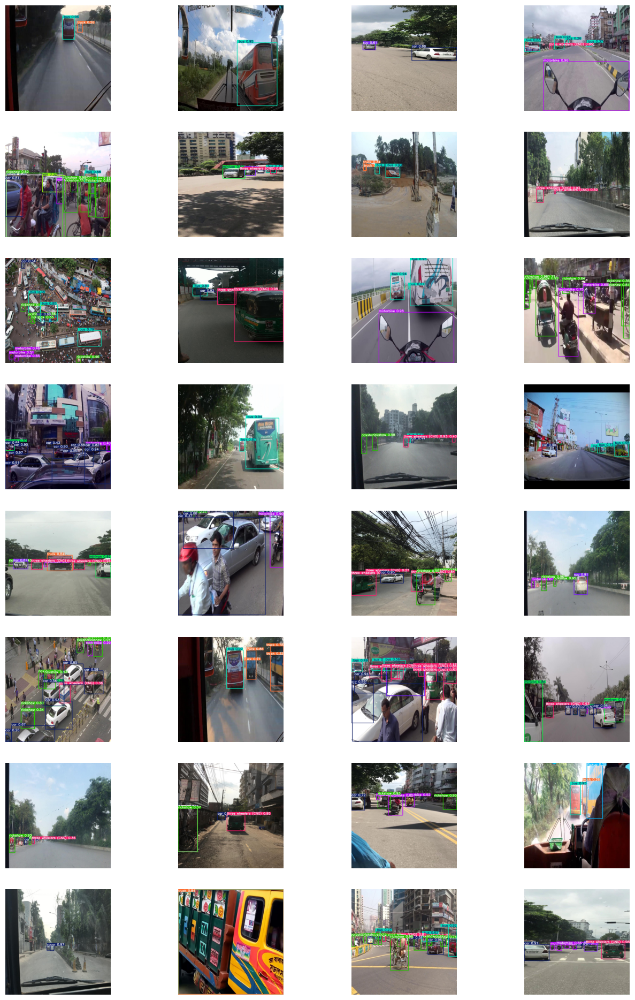

In [31]:
images_val = read_images_from_folder('/content/runs/detect/predict7','jpg')
sample_images = sample_images32(images_val)
show_images(sample_images)